In [1]:
import matplotlib.pyplot as plt 
import matplotlib.dates as mdates
import seaborn as sns
import numpy as np
import pandas as pd
import os

import plotly.graph_objects as go
from sklearn.datasets import load_iris
from sklearn.datasets import load_digits  
from sklearn.decomposition import PCA

#경고 무시
import warnings
warnings.filterwarnings(action="ignore")

#멧플롯립 에서 한글깨짐 방지 위한 코드. 
if os.name == "posix":
    plt.rc("font", family ="AppleGothic")
else:
    plt.rc("font", family ="Malgun Gothic ")

In [139]:
case = pd.read_csv('C:/Users/carlo/Desktop/AI_CWNU/documents/COVID-19/COVID-19/Case.csv')
timeAge = pd.read_csv('C:/Users/carlo/Desktop/AI_CWNU/documents/COVID-19/COVID-19/TimeAge.csv')
time = pd.read_csv('C:/Users/carlo/Desktop/AI_CWNU/documents/COVID-19/COVID-19/Time.csv')
timeProvince = pd.read_csv('C:/Users/carlo/Desktop/AI_CWNU/documents/COVID-19/COVID-19/TimeProvince.csv')
timeGender = pd.read_csv('C:/Users/carlo/Desktop/AI_CWNU/documents/COVID-19/COVID-19/TimeGender.csv') 

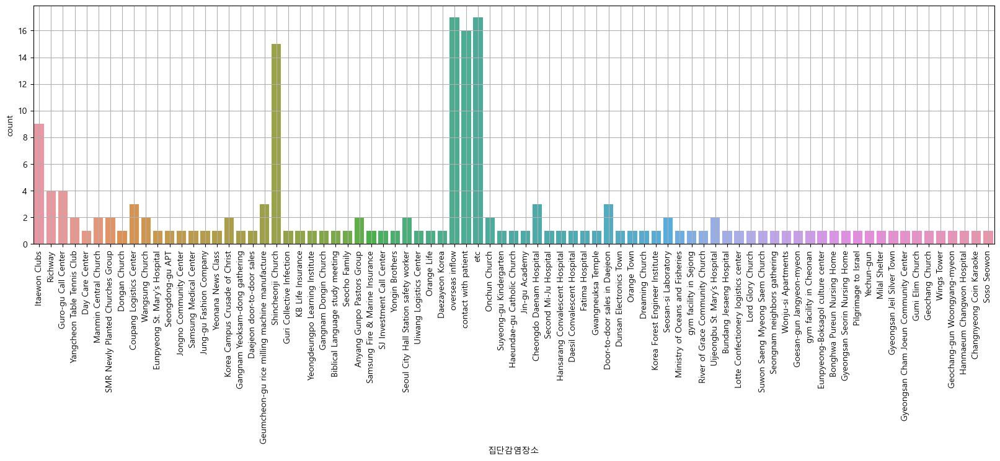

In [33]:
#case 데이터 분석. 
# case.head()


#열이름 변경
case.columns = ["사례번호","시도","군구","집단감염여부","집단감염장소","확진자누적수","위도","경도"]
# case.head()

#case 기본정보확인
# case.info() #데이터타잎 잘봐야함. ! 

#감염 장소 궁복확인
# case["집단감염장소"].value_counts()

#그래프그리기 
plt.figure(figsize =(20,5)) #그래프 사이즈 조절
plt.xticks(rotation=90) # x 축 돌리기
sns.countplot(x="집단감염장소" , data = case) # x 축을 집단감염장소 , data를 case 에서받아옴. 
plt.grid() # 바둑판 선긋기 

In [47]:
#장소별 확진자 수 확인 

NOCP = case.groupby("집단감염장소", as_index = False).agg(감염자수 = ("확진자누적수","sum")) 

        #집단감염장소로 하되 index 위치에 넣지않고, agg 로 감염자 수를 확진자 누적수의 총합을 넣은 NOCP에 대입 

NOCP

,집단감염장소,감염자수
0,Anyang Gunpo Pastors Group,23
1,Biblical Language study meeting,3
2,Bonghwa Pureun Nursing Home,68
3,Bundang Jesaeng Hospital,22
4,Changnyeong Coin Karaoke,7
...,...,...
76,contact with patient,1403
77,etc,1192
78,gym facility in Cheonan,103
79,gym facility in Sejong,8


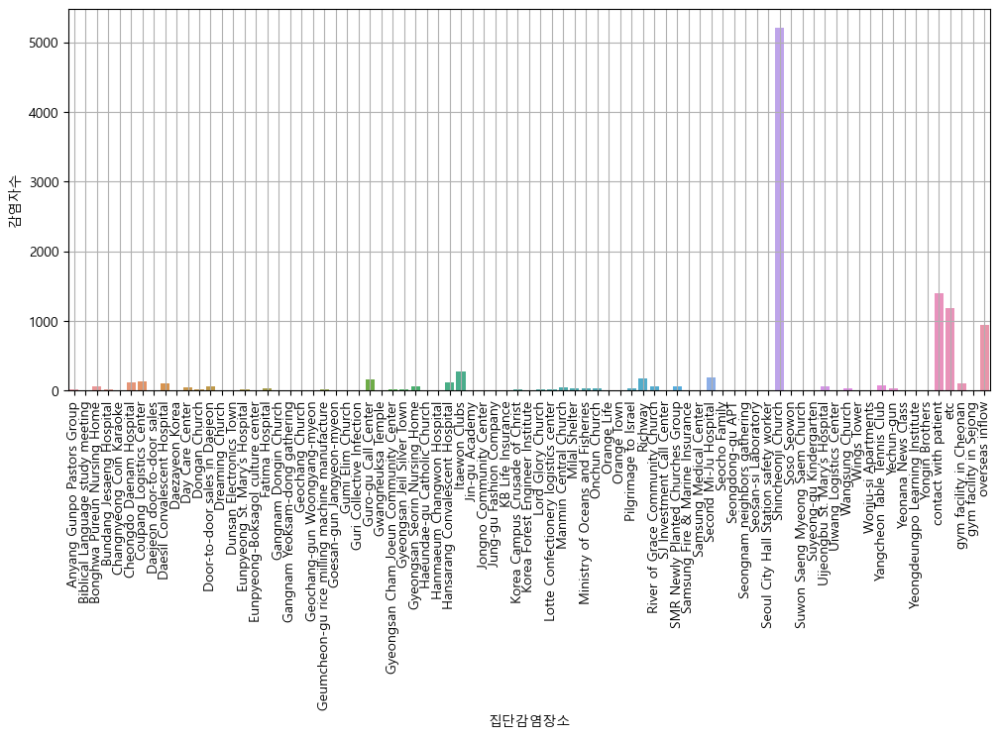

In [56]:
#장소별 확진자 수 그래프 작성 

plt.figure(figsize=(12,5))
plt.xticks(rotation=90)
sns.barplot(x = "집단감염장소" , y = "감염자수" , data= NOCP)
plt.grid()

In [64]:
# Time 데이터 분석
# time

#열이름 변경
time.columns = ["날짜", "시간", "검사자누적숫자", "음성누적숫자", "양성누적숫자", "완치자누적숫자","사망자누적숫자"]
# time

#결측치 확인
# time.isna().sum()

#x 축 눈금 간격 조정
start_date = pd.to_datetime("2020-01-20") #시작날짜  #datetime으로 형변환
end_date = pd.to_datetime("2020-06-30") #마지막날짜  #datetime으로 형변환
 
dates = pd.date_range(start_date , end_date , freq ="D")
x_values = np.arange(len(dates)) #갯수 안맞으면 에러나서 이작업을 해줌. 

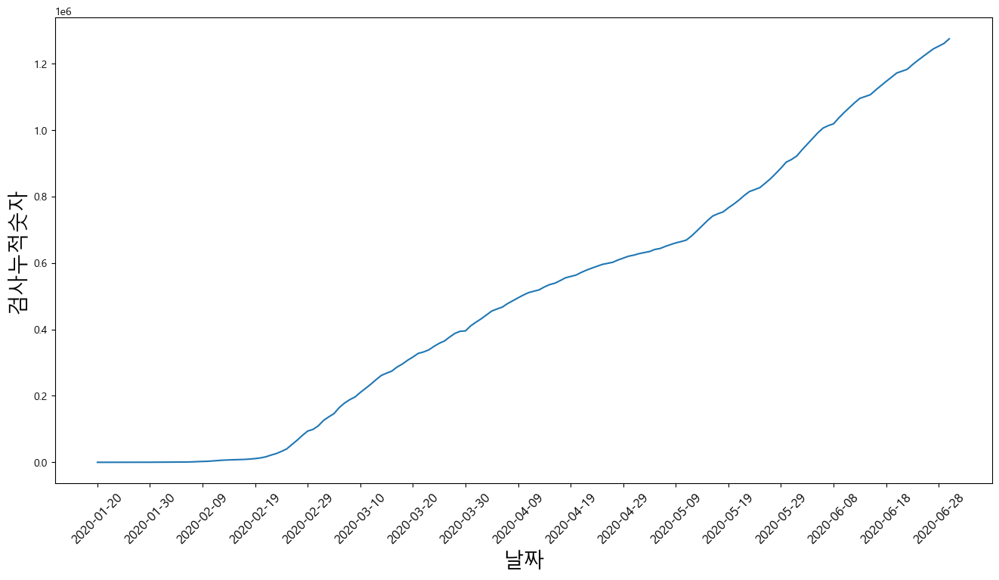

In [72]:
#검사자 누적숫자
plt.figure(figsize =(16,8))
ax = sns.lineplot(x = x_values , y = "검사자누적숫자" , data = time) #line그래프그리는데 x 축은 날짜, y 는 누적숫자 ,data는time으로
ax.set_xticks(x_values[::10]) #이걸안해주면 x 축 다다닥 다붙음. 
ax.set_xticklabels(dates[::10].strftime("%Y-%m-%d"), rotation = 45 , fontsize =12) 
# [::10] 처음부터 10씩 뛰어서 그래서 위와같이해야함, strftime("%Y-%M-%d") 이렇게 되는 M 는 0이나옴 주의 해야함! 날자 포멧형식.

plt.xlabel("날짜",fontsize= 20)
plt.ylabel("검사누적숫자",fontsize= 20)
plt.show()

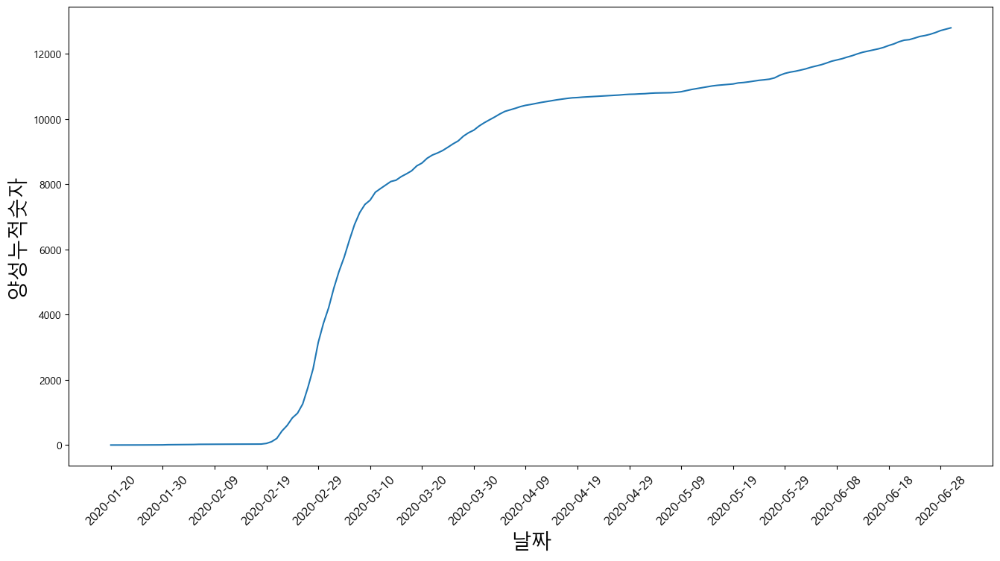

In [73]:
#양성 누적숫자
plt.figure(figsize =(16,8))
ax = sns.lineplot(x = x_values , y = "양성누적숫자" , data = time)
ax.set_xticks(x_values[::10])
ax.set_xticklabels(dates[::10].strftime("%Y-%m-%d"), rotation = 45 , fontsize =12)  

plt.xlabel("날짜",fontsize= 20)
plt.ylabel("양성누적숫자",fontsize= 20)
plt.show()

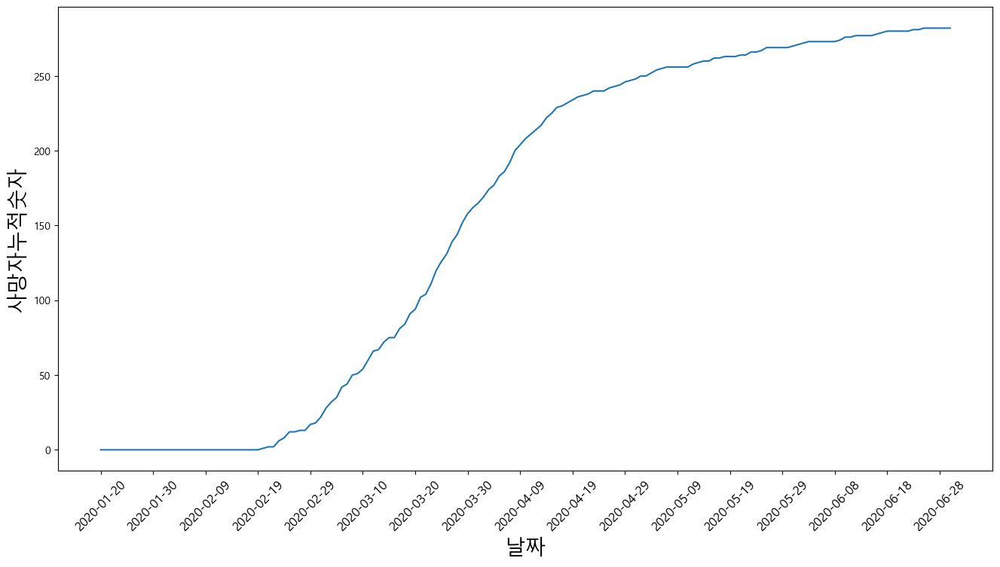

In [75]:
#사망자 누적숫자 
plt.figure(figsize =(16,8))
ax = sns.lineplot(x = x_values , y = "사망자누적숫자" , data = time)
ax.set_xticks(x_values[::10])
ax.set_xticklabels(dates[::10].strftime("%Y-%m-%d"), rotation = 45 , fontsize =12)  

plt.xlabel("날짜",fontsize= 20)
plt.ylabel("사망자누적숫자",fontsize= 20)
plt.show()

In [99]:
# timeAge

#결측지 확인
# timeAge.isna().sum()

#정보확인
# timeAge.info() # date 에 Dtype이 object 라 나중에 datetime type으로 바꿔줘야함. 

#time 열은 필요 없음으로 삭제
# timeAge["time"].value_counts()
# timeAge = timeAge.drop(["time"], axis=1)

#열이름변겅
# timeAge.columns = ["날짜", "연령대","확진자수","사망자수"]
# timeAge

#날짜열 datetime type으로 변경
timeAge["날짜"] = pd.to_datetime(timeAge["날짜"])
# timeAge.info()

#연령대확인
timeAge["연령대"].unique()

#날짜 열을 월로 변환하고 월 열을 생성
timeAge["월"] = timeAge["날짜"].dt.to_period("M") 
# timeAge

monthly_data = timeAge.groupby(["월" , "연령대"], as_index=False).sum() #월마다 groupping 해주고 그뒤에 연령대로 해서
                        #월마다의 연령대가 나오게 하되 index위치에 월이 들어가지 않게함 그렇게해서 더해준숫자를넣어줌 
monthly_data

,월,연령대,확진자수,사망자수
0,2020-03,0s,2435,0
1,2020-03,10s,12248,0
2,2020-03,20s,67073,0
3,2020-03,30s,25083,30
4,2020-03,40s,33072,30
5,2020-03,50s,45569,206
6,2020-03,60s,29896,454
7,2020-03,70s,15063,848
8,2020-03,80s,8718,1004
9,2020-04,0s,3969,0


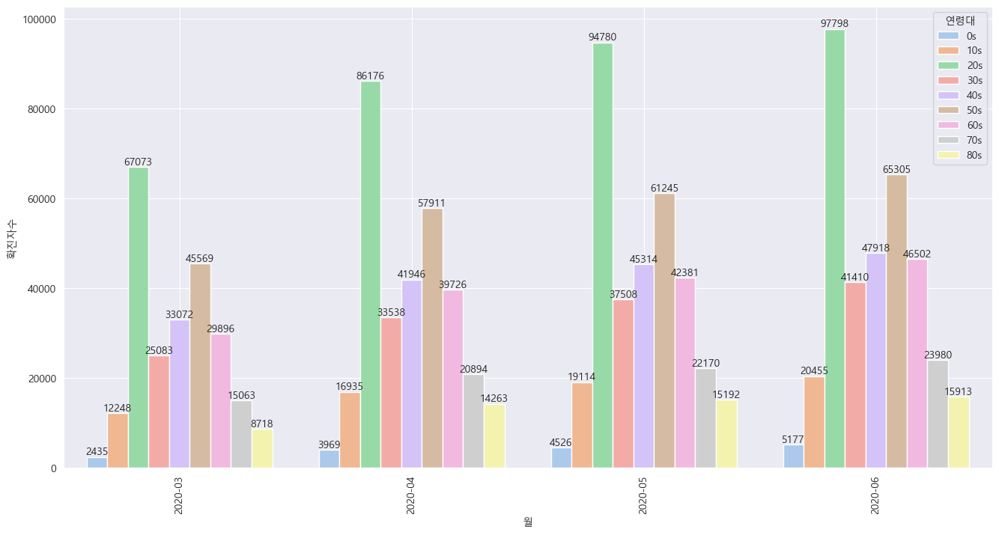

In [116]:
plt.figure(figsize =(16,8))
ax = plt.gca()

plt.xticks(rotation=90)
sns.barplot(x="월" , y ="확진자수", data = monthly_data , palette = "pastel",hue = "연령대")

for p in ax.patches:
    ax.annotate(f'{p.get_height():.0f}' ,
                (p.get_x() + p.get_width() / 2 ,p.get_height()) , 
                ha = "center" , va = "bottom")

plt.grid()
plt.show()

([], [])

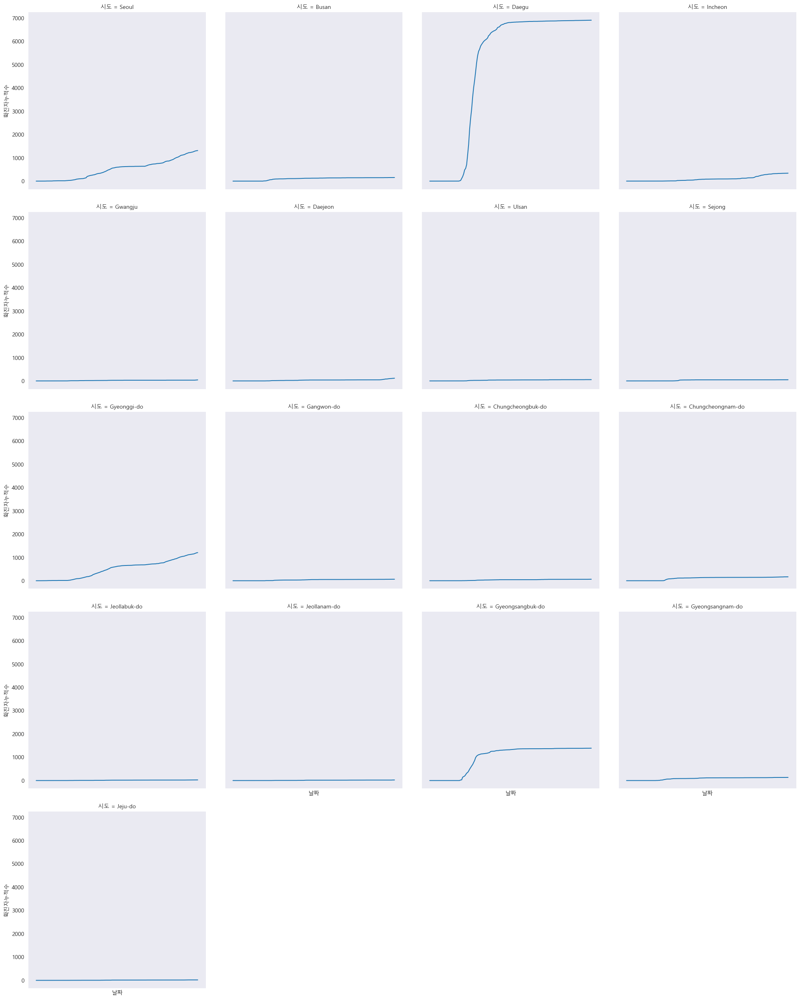

In [134]:
#TimeProvince 데이터 분석
# timeProvince

#열이름변경
# timeProvince.columns = ["날짜","시간","시도","확진자누적수","완치자누적수","사망자누적수"]
# timeProvince.head()

#시간열 삭제 (필요없는열 삭제)
# timeProvince = timeProvince.drop("시간",axis=1)
# timeProvince.head()

# #결측치 확인
# timeProvince.isna().sum()

ax = sns.relplot(data = timeProvince, x = "날짜",
                 y ="확진자누적수",
                kind = "line", 
                col = "시도",
                col_wrap = 4 ,
                sizes = (16,6))

plt.xticks([]) #x 축 날짜 지우기  

In [143]:
# TimeGender 데이터
# timeGender

#열이름변경
timeGender.columns = ["날짜" ,"기간","성별","확진자누적수","사망자누적수"]
# timeGender

#결측치확인
# timeGender.isna().sum() -> OK 없음

#정보
# timeGender.info() -> 날짜를 타입변경해야함

#타입변경
# timeGender["날짜"] = pd.to_datetime(timeGender["날짜"])
# timeGender.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 242 entries, 0 to 241
Data columns (total 5 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   날짜      242 non-null    datetime64[ns]
 1   기간      242 non-null    int64         
 2   성별      242 non-null    object        
 3   확진자누적수  242 non-null    int64         
 4   사망자누적수  242 non-null    int64         
dtypes: datetime64[ns](1), int64(3), object(1)
memory usage: 9.6+ KB


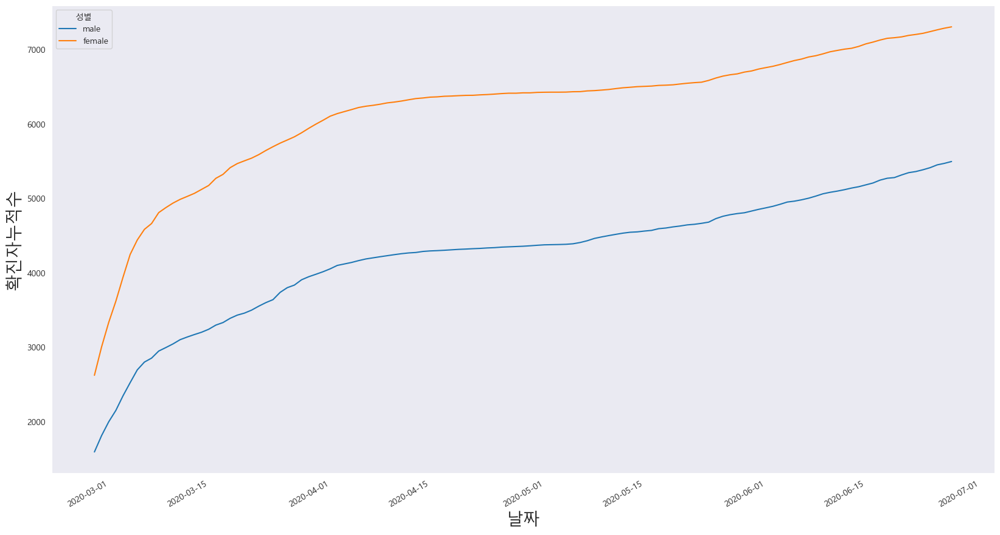

In [144]:
plt.figure(figsize= (20,10))
plt.xticks(rotation = 30 )
plt.xlabel("날짜", fontsize=20)
plt.ylabel("확진자누적수", fontsize=20)
sns.lineplot(data = timeGender , x = "날짜", y = "확진자누적수" , hue = "성별")

plt.show()

In [147]:
fec = pd.read_csv('C:/Users/carlo/Desktop/AI_CWNU/documents/fec.csv')
fec

,cmte_id,cand_id,cand_nm,contbr_nm,contbr_city,contbr_st,contbr_zip,contbr_employer,contbr_occupation,contb_receipt_amt,contb_receipt_dt,receipt_desc,memo_cd,memo_text,form_tp,file_num
0,C00410118,P20002978,"Bachmann, Michelle","HARVEY, WILLIAM",MOBILE,AL,366010290.0,RETIRED,RETIRED,250.0,20-JUN-11,NaN,NaN,NaN,SA17A,736166
1,C00410118,P20002978,"Bachmann, Michelle","HARVEY, WILLIAM",MOBILE,AL,366010290.0,RETIRED,RETIRED,50.0,23-JUN-11,NaN,NaN,NaN,SA17A,736166
2,C00410118,P20002978,"Bachmann, Michelle","SMITH, LANIER",LANETT,AL,368633403.0,INFORMATION REQUESTED,INFORMATION REQUESTED,250.0,05-JUL-11,NaN,NaN,NaN,SA17A,749073
3,C00410118,P20002978,"Bachmann, Michelle","BLEVINS, DARONDA",PIGGOTT,AR,724548253.0,NONE,RETIRED,250.0,01-AUG-11,NaN,NaN,NaN,SA17A,749073
4,C00410118,P20002978,"Bachmann, Michelle","WARDENBURG, HAROLD",HOT SPRINGS NATION,AR,719016467.0,NONE,RETIRED,300.0,20-JUN-11,NaN,NaN,NaN,SA17A,736166
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1001726,C00500587,P20003281,"Perry, Rick","GORMAN, CHRIS D. MR.",INFO REQUESTED,XX,99999,INFORMATION REQUESTED PER BEST EFFORTS,INFORMATION REQUESTED PER BEST EFFORTS,5000.0,29-SEP-11,REATTRIBUTION / REDESIGNATION REQUESTED (AUTOM...,NaN,REATTRIBUTION / REDESIGNATION REQUESTED (AUTOM...,SA17A,751678
1001727,C00500587,P20003281,"Perry, Rick","DUFFY, DAVID A. MR.",INFO REQUESTED,XX,99999,DUFFY EQUIPMENT COMPANY INC.,BUSINESS OWNER,2500.0,30-SEP-11,NaN,NaN,NaN,SA17A,751678
1001728,C00500587,P20003281,"Perry, Rick","GRANE, BRYAN F. MR.",INFO REQUESTED,XX,99999,INFORMATION REQUESTED PER BEST EFFORTS,INFORMATION REQUESTED PER BEST EFFORTS,500.0,29-SEP-11,NaN,NaN,NaN,SA17A,751678
1001729,C00500587,P20003281,"Perry, Rick","TOLBERT, DARYL MR.",INFO REQUESTED,XX,99999,T.A.C.C.,LONGWALL MAINTENANCE FOREMAN,500.0,30-SEP-11,NaN,NaN,NaN,SA17A,751678


In [191]:
import json
# json file 여는법 1

# JSON 파일 경로 지정
file_path = "C:/Users/carlo/Desktop/AI_CWNU/documents/usda_food.json"

# JSON 파일 열기
with open(file_path, "r") as file:
    data = json.load(file)
data

[{'id': 1008,
  'description': 'Cheese, caraway',
  'tags': [],
  'manufacturer': '',
  'group': 'Dairy and Egg Products',
  'portions': [{'amount': 1, 'unit': 'oz', 'grams': 28.35}],
  'nutrients': [{'value': 25.18,
    'units': 'g',
    'description': 'Protein',
    'group': 'Composition'},
   {'value': 29.2,
    'units': 'g',
    'description': 'Total lipid (fat)',
    'group': 'Composition'},
   {'value': 3.06,
    'units': 'g',
    'description': 'Carbohydrate, by difference',
    'group': 'Composition'},
   {'value': 3.28, 'units': 'g', 'description': 'Ash', 'group': 'Other'},
   {'value': 376.0,
    'units': 'kcal',
    'description': 'Energy',
    'group': 'Energy'},
   {'value': 39.28,
    'units': 'g',
    'description': 'Water',
    'group': 'Composition'},
   {'value': 1573.0,
    'units': 'kJ',
    'description': 'Energy',
    'group': 'Energy'},
   {'value': 0.0,
    'units': 'g',
    'description': 'Fiber, total dietary',
    'group': 'Composition'},
   {'value': 673.0,


In [312]:
# 방법2
usda = json.load(open("C:/Users/carlo/Desktop/AI_CWNU/documents/usda_food.json"))

In [313]:
usda[0].keys()

dict_keys(['id', 'description', 'tags', 'manufacturer', 'group', 'portions', 'nutrients'])

In [316]:
usda[0]["nutrients"][0]


{'value': 25.18,
 'units': 'g',
 'description': 'Protein',
 'group': 'Composition'}

In [331]:
nutrient_dict = pd.DataFrame(usda[0]["nutrients"])
nutrient_dict
# value = nutrient_dict['value']
# value

# desc = nutrient_dict['description']
# desc

,value,units,description,group
0,25.180,g,Protein,Composition
1,29.200,g,Total lipid (fat),Composition
2,3.060,g,"Carbohydrate, by difference",Composition
3,3.280,g,Ash,Other
4,376.000,kcal,Energy,Energy
...,...,...,...,...
157,1.472,g,Serine,Amino Acids
158,93.000,mg,Cholesterol,Other
159,18.584,g,"Fatty acids, total saturated",Other
160,8.275,g,"Fatty acids, total monounsaturated",Other


In [334]:
grouped_df = nutrient_dict.groupby('group')
for group, data in grouped_df:
    print("Group:", group)
    print(data)
    print()

Group: Amino Acids
     value units    description        group
36   0.324     g     Tryptophan  Amino Acids
37   0.896     g      Threonine  Amino Acids
38   1.563     g     Isoleucine  Amino Acids
39   2.412     g        Leucine  Amino Acids
40   2.095     g         Lysine  Amino Acids
41   0.659     g     Methionine  Amino Acids
42   0.126     g        Cystine  Amino Acids
43   1.326     g  Phenylalanine  Amino Acids
44   1.216     g       Tyrosine  Amino Acids
45   1.682     g         Valine  Amino Acids
46   0.952     g       Arginine  Amino Acids
47   0.884     g      Histidine  Amino Acids
48   0.711     g        Alanine  Amino Acids
49   1.618     g  Aspartic acid  Amino Acids
50   6.160     g  Glutamic acid  Amino Acids
51   0.439     g        Glycine  Amino Acids
52   2.838     g        Proline  Amino Acids
53   1.472     g         Serine  Amino Acids
86   0.324     g     Tryptophan  Amino Acids
87   0.896     g      Threonine  Amino Acids
88   1.563     g     Isoleucine  Ami

In [224]:
nutrient = pd.DataFrame(usda[0]["nutrients"])
nutrient


,value,units,description,group
0,25.180,g,Protein,Composition
1,29.200,g,Total lipid (fat),Composition
2,3.060,g,"Carbohydrate, by difference",Composition
3,3.280,g,Ash,Other
4,376.000,kcal,Energy,Energy
...,...,...,...,...
157,1.472,g,Serine,Amino Acids
158,93.000,mg,Cholesterol,Other
159,18.584,g,"Fatty acids, total saturated",Other
160,8.275,g,"Fatty acids, total monounsaturated",Other


In [206]:
foods = pd.DataFrame(usda , columns = ['id', 'description', 'manufacturer', 'group'])
foods["group"].value_counts()

,id,description,manufacturer,group
0,1008,"Cheese, caraway",,Dairy and Egg Products
1,1009,"Cheese, cheddar",,Dairy and Egg Products
2,1018,"Cheese, edam",,Dairy and Egg Products
3,1019,"Cheese, feta",,Dairy and Egg Products
4,1028,"Cheese, mozzarella, part skim milk",,Dairy and Egg Products
...,...,...,...,...
6631,42161,"Bologna, beef, low fat",,Sausages and Luncheon Meats
6632,42173,"Turkey and pork sausage, fresh, bulk, patty or...",,Sausages and Luncheon Meats
6633,43408,"Babyfood, juice, pear",None,Baby Foods
6634,43539,"Babyfood, dessert, banana yogurt, strained",None,Baby Foods


In [267]:
#그룹별로 그룹안에 있는 모든음식들을 통계를 내서 중간값을 낼것
gfood = foods.groupby("group")
nutrient1 = nutrient.agg({"value" : "median"})
nutrient1 ?xxxxxxxxxxxxxxxxxxxxxx

value    1.8885
dtype: float64

In [311]:
tmp = pd.DataFrame(usda , columns = ['id', 'group'])
tmp2 = pd.DataFrame(usda , columns = ["nutrients"])

tmp3  =pd.concat([tmp,tmp2] , axis=1)
tmp3

,id,group,nutrients
0,1008,Dairy and Egg Products,"[{'value': 25.18, 'units': 'g', 'description':..."
1,1009,Dairy and Egg Products,"[{'value': 24.9, 'units': 'g', 'description': ..."
2,1018,Dairy and Egg Products,"[{'value': 4.22, 'units': 'g', 'description': ..."
3,1019,Dairy and Egg Products,"[{'value': 5.2, 'units': 'g', 'description': '..."
4,1028,Dairy and Egg Products,"[{'value': 3.27, 'units': 'g', 'description': ..."
...,...,...,...
6631,42161,Sausages and Luncheon Meats,"[{'value': 11.8, 'units': 'g', 'description': ..."
6632,42173,Sausages and Luncheon Meats,"[{'value': 22.7, 'units': 'g', 'description': ..."
6633,43408,Baby Foods,"[{'value': 0.0, 'units': 'g', 'description': '..."
6634,43539,Baby Foods,"[{'value': 1.1, 'units': 'g', 'description': '..."


,id,group,nutrients
0,1008,Dairy and Egg Products,"[{'value': 25.18, 'units': 'g', 'description':..."
1,1009,Dairy and Egg Products,"[{'value': 24.9, 'units': 'g', 'description': ..."
2,1018,Dairy and Egg Products,"[{'value': 4.22, 'units': 'g', 'description': ..."
3,1019,Dairy and Egg Products,"[{'value': 5.2, 'units': 'g', 'description': '..."
4,1028,Dairy and Egg Products,"[{'value': 3.27, 'units': 'g', 'description': ..."
...,...,...,...
6631,42161,Sausages and Luncheon Meats,"[{'value': 11.8, 'units': 'g', 'description': ..."
6632,42173,Sausages and Luncheon Meats,"[{'value': 22.7, 'units': 'g', 'description': ..."
6633,43408,Baby Foods,"[{'value': 0.0, 'units': 'g', 'description': '..."
6634,43539,Baby Foods,"[{'value': 1.1, 'units': 'g', 'description': '..."


In [335]:
# 교수님이 하신것 .
usda = json.load(open("C:/Users/carlo/Desktop/AI_CWNU/documents/usda_food.json"))

In [336]:
pd.DataFrame(usda[0]["nutrients"])

,value,units,description,group
0,25.180,g,Protein,Composition
1,29.200,g,Total lipid (fat),Composition
2,3.060,g,"Carbohydrate, by difference",Composition
3,3.280,g,Ash,Other
4,376.000,kcal,Energy,Energy
...,...,...,...,...
157,1.472,g,Serine,Amino Acids
158,93.000,mg,Cholesterol,Other
159,18.584,g,"Fatty acids, total saturated",Other
160,8.275,g,"Fatty acids, total monounsaturated",Other


In [337]:
len(usda) #이게 음식갯수 

6636

In [397]:
# dd= pd.DataFrame(0["nutrients"], columns =["value","description","id"])
# dd
cnt = 0
for f in usda:
    f
    if cnt ==1:
        break
f[]

{'id': 43546,
 'description': 'Babyfood, banana no tapioca, strained',
 'tags': [],
 'manufacturer': None,
 'group': 'Baby Foods',
 'portions': [{'amount': 1, 'unit': 'tbsp', 'grams': 15.0},
  {'amount': 2, 'unit': 'jar NFS', 'grams': 113.0},
  {'amount': 3, 'unit': "jar Beech-Nut Baby's First (2.5 oz)", 'grams': 71.0},
  {'amount': 4, 'unit': 'jar Beech-Nut Stage I (4 oz)', 'grams': 113.0},
  {'amount': 5, 'unit': 'jar Gerber First Foods (2.5 oz)', 'grams': 71.0},
  {'amount': 6, 'unit': "jar Earth's Best (4.5 oz)", 'grams': 128.0},
  {'amount': 7, 'unit': 'jar Heinz Beginner-1 (2.5 oz)', 'grams': 71.0}],
 'nutrients': [{'value': 1.0,
   'units': 'g',
   'description': 'Protein',
   'group': 'Composition'},
  {'value': 0.2,
   'units': 'g',
   'description': 'Total lipid (fat)',
   'group': 'Composition'},
  {'value': 21.34,
   'units': 'g',
   'description': 'Carbohydrate, by difference',
   'group': 'Composition'},
  {'value': 0.76, 'units': 'g', 'description': 'Ash', 'group': 'Othe

In [352]:
dfs = [] 
for f in usda:
    df = pd.DataFrame(f["nutrients"], columns =["value","description","id"])# columns은 필요한 특성만들고옴 젤위에꺼
    df["id"] = f['id']  #어떤음식인지 정보가없음 이름데이터도 년도도 없어서 따로 넣어저야함
    dfs.append(df)
nutrients =pd.concat(dfs)  
nutrients



,value,description,id
0,25.180,Protein,1008
1,29.200,Total lipid (fat),1008
2,3.060,"Carbohydrate, by difference",1008
3,3.280,Ash,1008
4,376.000,Energy,1008
...,...,...,...
45,0.000,"Vitamin B-12, added",43546
46,0.000,Cholesterol,43546
47,0.072,"Fatty acids, total saturated",43546
48,0.028,"Fatty acids, total monounsaturated",43546


In [353]:
nutrients["description"].value_counts()

Energy                         13704
Protein                         6866
Carbohydrate, by difference     6866
Total lipid (fat)               6866
Water                           6862
                               ...  
Stigmasterol                      96
Campesterol                       96
Beta-sitosterol                   96
Vitamin D2 (ergocalciferol)       33
Adjusted Protein                   2
Name: description, Length: 94, dtype: int64

In [354]:
foods = pd.DataFrame(usda , columns = ['id', 'group'])
foods

,id,group
0,1008,Dairy and Egg Products
1,1009,Dairy and Egg Products
2,1018,Dairy and Egg Products
3,1019,Dairy and Egg Products
4,1028,Dairy and Egg Products
...,...,...
6631,42161,Sausages and Luncheon Meats
6632,42173,Sausages and Luncheon Meats
6633,43408,Baby Foods
6634,43539,Baby Foods


In [379]:
tmp = pd.merge(nutrients, foods, on="id", how = "outer")
tmp

#inner: 공통된 키 값만을 사용하여 병합합니다. 즉, 병합의 결과로 생성되는 데이터프레임에는 병합에 참여한 
#두 데이터프레임의 공통된 키 값만 포함됩니다.

# outer: 모든 키 값을 사용하여 병합합니다. 즉, 병합의 결과로 생성되는 데이터프레임에는 병합에 참여한 
#두 데이터프레임의 모든 키 값이 포함됩니다. 만약 키 값이 한 쪽 데이터프레임에만 존재하는 경우에는 결측치(NaN)로 처리됩니다.

#389355 rows 가있는데 on -> 이게 key 라고생각하면됨 id를 기준으로 생각하면되는데


,value,description,id,group
0,25.180,Protein,1008,Dairy and Egg Products
1,29.200,Total lipid (fat),1008,Dairy and Egg Products
2,3.060,"Carbohydrate, by difference",1008,Dairy and Egg Products
3,3.280,Ash,1008,Dairy and Egg Products
4,376.000,Energy,1008,Dairy and Egg Products
...,...,...,...,...
389350,0.000,"Vitamin B-12, added",43546,Baby Foods
389351,0.000,Cholesterol,43546,Baby Foods
389352,0.072,"Fatty acids, total saturated",43546,Baby Foods
389353,0.028,"Fatty acids, total monounsaturated",43546,Baby Foods


In [386]:
# 예를 들어 데이터 프레임이 2개있다 했을때
df1 = pd.DataFrame([["a",1],["b",2],["c",3]] , columns=["a","n"]) 
df2 = pd.DataFrame([["a",1],["c",2],["d",3]] , columns=["a","n"]) 

pd.merge(df1,df2 , on ="a" , how = "outer") 

,a,n_x,n_y
0,a,1.0,1.0
1,b,2.0,NaN
2,c,3.0,2.0
3,d,NaN,3.0


In [387]:
pd.merge(df1,df2 , on ="a" , how = "inner") 

,a,n_x,n_y
0,a,1,1
1,c,3,2


In [357]:
tmp.groupby(["description","group"])["value"].median()

description       group                            
Adjusted Protein  Sweets                               12.900
                  Vegetables and Vegetable Products     2.180
Alanine           Baby Foods                            0.107
                  Baked Products                        0.248
                  Beef Products                         1.550
                                                        ...  
Zinc, Zn          Snacks                                1.470
                  Soups, Sauces, and Gravies            0.200
                  Spices and Herbs                      2.750
                  Sweets                                0.360
                  Vegetables and Vegetable Products     0.330
Name: value, Length: 2246, dtype: float64

In [360]:
Zn=tmp.groupby(["description","group"])["value"].median()["Zinc, Zn"] #아연만 뽑아주는것. 
Zn

group
Baby Foods                           0.590
Baked Products                       0.660
Beef Products                        5.390
Beverages                            0.040
Breakfast Cereals                    2.885
Cereal Grains and Pasta              1.090
Dairy and Egg Products               1.330
Ethnic Foods                         1.045
Fast Foods                           1.250
Fats and Oils                        0.020
Finfish and Shellfish Products       0.670
Fruits and Fruit Juices              0.100
Lamb, Veal, and Game Products        3.940
Legumes and Legume Products          1.140
Meals, Entrees, and Sidedishes       0.630
Nut and Seed Products                3.290
Pork Products                        2.320
Poultry Products                     2.500
Restaurant Foods                     0.800
Sausages and Luncheon Meats          2.130
Snacks                               1.470
Soups, Sauces, and Gravies           0.200
Spices and Herbs                     2.750
Sweet

<Axes: ylabel='group'>

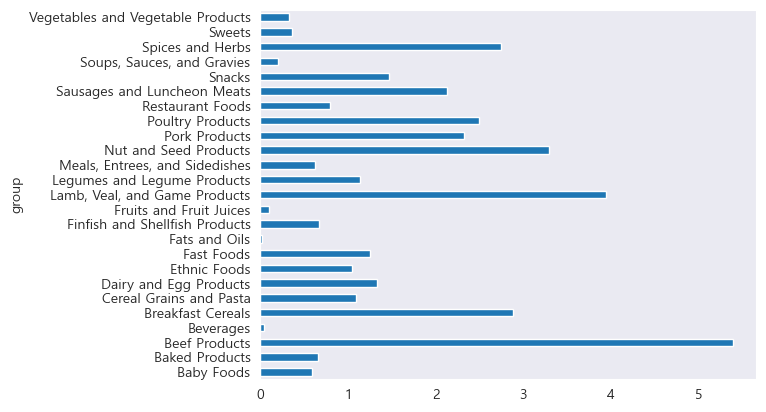

In [361]:
Zn.plot(kind="barh")

<Axes: ylabel='group'>

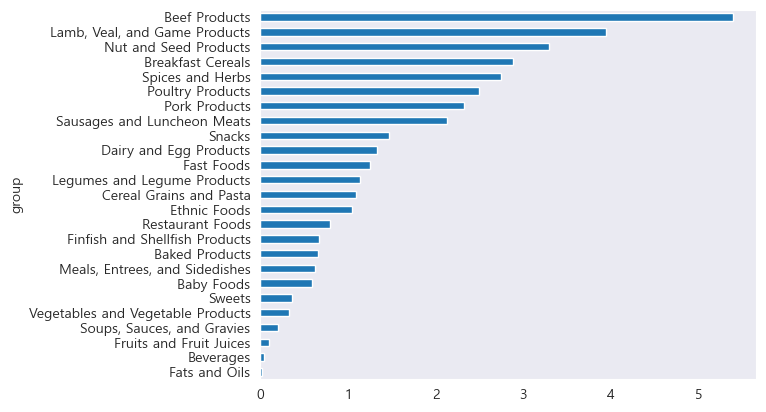

In [365]:
# 만약순서대로 하러면 
Zn.sort_values().plot(kind="barh")

In [369]:
#groupby말고 다른방법. 
pt = tmp.pivot_table("value", index = "group", columns ="description", aggfunc="median") #default가 평균. 
pt

description,Adjusted Protein,Alanine,"Alcohol, ethyl",Arginine,Ash,Aspartic acid,Beta-sitosterol,Betaine,Caffeine,"Calcium, Ca",...,"Vitamin C, total ascorbic acid",Vitamin D,Vitamin D (D2 + D3),Vitamin D2 (ergocalciferol),Vitamin D3 (cholecalciferol),Vitamin E (alpha-tocopherol),"Vitamin E, added",Vitamin K (phylloquinone),Water,"Zinc, Zn"
group,,,,,,,,,,,,,,,,,,,,,
Baby Foods,NaN,0.1070,0.0,0.1090,0.640,0.2340,0.0,0.60,0.0,62.0,...,9.50,35.0,0.90,NaN,0.00,0.830,0.0,5.25,81.900,0.590
Baked Products,NaN,0.2480,0.0,0.2985,1.800,0.3965,17.0,20.00,0.0,51.0,...,0.00,0.0,0.00,NaN,NaN,0.470,0.0,4.40,18.075,0.660
Beef Products,NaN,1.5500,0.0,1.6670,1.060,2.3605,NaN,13.90,0.0,12.0,...,0.00,5.0,0.10,NaN,0.10,0.280,0.0,1.50,62.015,5.390
Beverages,NaN,0.0030,0.0,0.0000,0.200,0.0050,NaN,0.10,0.0,8.0,...,0.25,0.0,0.00,1.00,NaN,0.000,0.0,0.00,87.000,0.040
Breakfast Cereals,NaN,0.3110,0.0,0.2800,2.390,0.4650,NaN,13.75,0.0,47.0,...,0.10,68.0,1.70,NaN,3.70,0.550,0.0,1.20,3.760,2.885
Cereal Grains and Pasta,NaN,0.3730,0.0,0.4110,0.730,0.4830,NaN,23.10,0.0,19.0,...,0.00,0.0,0.00,NaN,NaN,0.120,0.0,0.30,11.920,1.090
Dairy and Egg Products,NaN,0.2730,0.0,0.2860,1.500,0.6000,0.0,0.70,0.0,171.0,...,0.10,16.0,0.40,1.10,0.50,0.150,0.0,0.70,70.830,1.330
Ethnic Foods,NaN,1.2900,0.0,1.3100,1.300,2.1375,4.0,7.50,0.0,17.5,...,0.00,0.0,0.00,NaN,NaN,0.470,0.0,0.30,69.600,1.045
Fast Foods,NaN,0.5140,0.0,0.5890,2.100,0.8990,NaN,15.40,0.0,79.0,...,0.60,3.0,0.10,NaN,0.20,0.700,0.0,6.90,49.720,1.250


In [370]:
pt["Zinc, Zn"]

group
Baby Foods                           0.590
Baked Products                       0.660
Beef Products                        5.390
Beverages                            0.040
Breakfast Cereals                    2.885
Cereal Grains and Pasta              1.090
Dairy and Egg Products               1.330
Ethnic Foods                         1.045
Fast Foods                           1.250
Fats and Oils                        0.020
Finfish and Shellfish Products       0.670
Fruits and Fruit Juices              0.100
Lamb, Veal, and Game Products        3.940
Legumes and Legume Products          1.140
Meals, Entrees, and Sidedishes       0.630
Nut and Seed Products                3.290
Pork Products                        2.320
Poultry Products                     2.500
Restaurant Foods                     0.800
Sausages and Luncheon Meats          2.130
Snacks                               1.470
Soups, Sauces, and Gravies           0.200
Spices and Herbs                     2.750
Sweet

In [371]:
#또 다른방법
tmp["description"] == "Zinc, Zn"

0         False
1         False
2         False
3         False
4         False
          ...  
389350    False
389351    False
389352    False
389353    False
389354    False
Name: description, Length: 389355, dtype: bool

In [372]:
tmp[tmp["description"] == "Zinc, Zn"]

,value,description,id,group
14,2.94,"Zinc, Zn",1008,Dairy and Egg Products
68,2.94,"Zinc, Zn",1008,Dairy and Egg Products
122,2.94,"Zinc, Zn",1008,Dairy and Egg Products
183,3.11,"Zinc, Zn",1009,Dairy and Egg Products
262,3.11,"Zinc, Zn",1009,Dairy and Egg Products
...,...,...,...,...
389119,1.83,"Zinc, Zn",42161,Sausages and Luncheon Meats
389170,3.17,"Zinc, Zn",42173,Sausages and Luncheon Meats
389222,0.08,"Zinc, Zn",43408,Baby Foods
389272,0.26,"Zinc, Zn",43539,Baby Foods


In [373]:
tmp[tmp["description"] == "Zinc, Zn"].groupby("group")["value"].median()

group
Baby Foods                           0.590
Baked Products                       0.660
Beef Products                        5.390
Beverages                            0.040
Breakfast Cereals                    2.885
Cereal Grains and Pasta              1.090
Dairy and Egg Products               1.330
Ethnic Foods                         1.045
Fast Foods                           1.250
Fats and Oils                        0.020
Finfish and Shellfish Products       0.670
Fruits and Fruit Juices              0.100
Lamb, Veal, and Game Products        3.940
Legumes and Legume Products          1.140
Meals, Entrees, and Sidedishes       0.630
Nut and Seed Products                3.290
Pork Products                        2.320
Poultry Products                     2.500
Restaurant Foods                     0.800
Sausages and Luncheon Meats          2.130
Snacks                               1.470
Soups, Sauces, and Gravies           0.200
Spices and Herbs                     2.750
Sweet

In [82]:
#대선후보들이 받은 기부금 목록 
fec = pd.read_csv('C:/Users/carlo/Desktop/AI_CWNU/documents/fec.csv')
fec

,cmte_id,cand_id,cand_nm,contbr_nm,contbr_city,contbr_st,contbr_zip,contbr_employer,contbr_occupation,contb_receipt_amt,contb_receipt_dt,receipt_desc,memo_cd,memo_text,form_tp,file_num
0,C00410118,P20002978,"Bachmann, Michelle","HARVEY, WILLIAM",MOBILE,AL,366010290.0,RETIRED,RETIRED,250.0,20-JUN-11,NaN,NaN,NaN,SA17A,736166
1,C00410118,P20002978,"Bachmann, Michelle","HARVEY, WILLIAM",MOBILE,AL,366010290.0,RETIRED,RETIRED,50.0,23-JUN-11,NaN,NaN,NaN,SA17A,736166
2,C00410118,P20002978,"Bachmann, Michelle","SMITH, LANIER",LANETT,AL,368633403.0,INFORMATION REQUESTED,INFORMATION REQUESTED,250.0,05-JUL-11,NaN,NaN,NaN,SA17A,749073
3,C00410118,P20002978,"Bachmann, Michelle","BLEVINS, DARONDA",PIGGOTT,AR,724548253.0,NONE,RETIRED,250.0,01-AUG-11,NaN,NaN,NaN,SA17A,749073
4,C00410118,P20002978,"Bachmann, Michelle","WARDENBURG, HAROLD",HOT SPRINGS NATION,AR,719016467.0,NONE,RETIRED,300.0,20-JUN-11,NaN,NaN,NaN,SA17A,736166
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1001726,C00500587,P20003281,"Perry, Rick","GORMAN, CHRIS D. MR.",INFO REQUESTED,XX,99999,INFORMATION REQUESTED PER BEST EFFORTS,INFORMATION REQUESTED PER BEST EFFORTS,5000.0,29-SEP-11,REATTRIBUTION / REDESIGNATION REQUESTED (AUTOM...,NaN,REATTRIBUTION / REDESIGNATION REQUESTED (AUTOM...,SA17A,751678
1001727,C00500587,P20003281,"Perry, Rick","DUFFY, DAVID A. MR.",INFO REQUESTED,XX,99999,DUFFY EQUIPMENT COMPANY INC.,BUSINESS OWNER,2500.0,30-SEP-11,NaN,NaN,NaN,SA17A,751678
1001728,C00500587,P20003281,"Perry, Rick","GRANE, BRYAN F. MR.",INFO REQUESTED,XX,99999,INFORMATION REQUESTED PER BEST EFFORTS,INFORMATION REQUESTED PER BEST EFFORTS,500.0,29-SEP-11,NaN,NaN,NaN,SA17A,751678
1001729,C00500587,P20003281,"Perry, Rick","TOLBERT, DARYL MR.",INFO REQUESTED,XX,99999,T.A.C.C.,LONGWALL MAINTENANCE FOREMAN,500.0,30-SEP-11,NaN,NaN,NaN,SA17A,751678


In [66]:
# fec.columns
fec["cand_nm"].value_counts()

Obama, Barack                     593746
Paul, Ron                         143757
Romney, Mitt                      107229
Gingrich, Newt                     47679
Santorum, Rick                     46559
Cain, Herman                       20107
Perry, Rick                        13575
Bachmann, Michelle                 13140
Roemer, Charles E. 'Buddy' III      5920
Pawlenty, Timothy                   4555
Huntsman, Jon                       4156
Johnson, Gary Earl                  1234
McCotter, Thaddeus G                  74
Name: cand_nm, dtype: int64

In [4]:
(fec["cand_nm"]=="Obama, Barack") | (fec["cand_nm"]=="Romney, Mitt")

0          False
1          False
2          False
3          False
4          False
           ...  
1001726    False
1001727    False
1001728    False
1001729    False
1001730    False
Name: cand_nm, Length: 1001731, dtype: bool

In [11]:
RvsO=fec[(fec["cand_nm"]=="Obama, Barack") | (fec["cand_nm"]=="Romney, Mitt")]
RvsO

,cmte_id,cand_id,cand_nm,contbr_nm,contbr_city,contbr_st,contbr_zip,contbr_employer,contbr_occupation,contb_receipt_amt,contb_receipt_dt,receipt_desc,memo_cd,memo_text,form_tp,file_num
411,C00431171,P80003353,"Romney, Mitt","ELDERBAUM, WILLIAM",DPO,AA,340230183.0,US GOVERNMENT,FOREIGN SERVICE OFFICER,25.0,01-FEB-12,NaN,NaN,NaN,SA17A,780124
412,C00431171,P80003353,"Romney, Mitt","ELDERBAUM, WILLIAM",DPO,AA,340230183.0,US GOVERNMENT,FOREIGN SERVICE OFFICER,110.0,01-FEB-12,NaN,NaN,NaN,SA17A,780124
413,C00431171,P80003353,"Romney, Mitt","CARLSEN, RICHARD",APO,AE,91280020.0,DEFENSE INTELLIGENCE AGENCY,INTELLIGENCE ANALYST,250.0,13-APR-12,NaN,NaN,NaN,SA17A,785689
414,C00431171,P80003353,"Romney, Mitt","DELUCA, PIERRE",APO,AE,91280005.0,CISCO,ENGINEER,30.0,21-AUG-11,NaN,NaN,NaN,SA17A,760261
415,C00431171,P80003353,"Romney, Mitt","SARGENT, MICHAEL",APO,AE,90120092.0,RAYTHEON TECHNICAL SERVICES CORP,COMPUTER SYSTEMS ENGINEER,100.0,07-MAR-12,NaN,NaN,NaN,SA17A,780128
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
701381,C00431445,P80003338,"Obama, Barack","MOUNTS, ROBERT",APO,ZZ,962043077,HQ USFK (FKDC-SA),GS-15 INTERNATIONAL RELATIONS OFFICER,25.0,26-FEB-12,NaN,NaN,NaN,SA17A,787803
701382,C00431445,P80003338,"Obama, Barack","TAITANO, TYRONE",HAGATNA,ZZ,969323373,NOT EMPLOYED,RETIRED,250.0,20-JAN-12,NaN,NaN,NaN,SA17A,775668
701383,C00431445,P80003338,"Obama, Barack","TUCKER, PAMELA",APO,ZZ,963190030,DODEA,EDUCATOR,3.0,20-JAN-12,NaN,NaN,NaN,SA17A,775668
701384,C00431445,P80003338,"Obama, Barack","MOUNTS, ROBERT",APO,ZZ,962043077,HQ USFK (FKDC-SA),GS-15 INTERNATIONAL RELATIONS OFFICER,25.0,26-APR-12,NaN,NaN,NaN,SA17A,785239


In [68]:
# Rvs["contbr_occupation"] #직업
# Rvs["contbr_receipt_amt"] #기부금

# 각 직업별로 각후보에게 기부한 총금액을 막대그래프로 나타내라 
Zn=RvsO.groupby(["contbr_occupation","contb_receipt_amt"])["contb_receipt_amt"].sum()  
Zn 


contbr_occupation                    contb_receipt_amt
   MIXED-MEDIA ARTIST / STORYTELLER  100.0                100.0
 AREA VICE PRESIDENT                 250.0                250.0
 RESEARCH ASSOCIATE                  100.0                100.0
 TEACHER                             500.0                500.0
 THERAPIST                           500.0                500.0
                                                          ...  
ZONE MANAGER                         75.0                  75.0
ZOOKEEPER                            35.0                  35.0
ZOOLOGIST                            100.0                200.0
                                     200.0                200.0
ZOOLOGY EDUCATION                    25.0                  25.0
Name: contb_receipt_amt, Length: 107113, dtype: float64

In [71]:
grouped_data = Zn.groupby("contbr_occupation").sum()
grouped_data

contbr_occupation
   MIXED-MEDIA ARTIST / STORYTELLER     100.0
 AREA VICE PRESIDENT                    250.0
 RESEARCH ASSOCIATE                     100.0
 TEACHER                                500.0
 THERAPIST                             3900.0
                                        ...  
ZEPPOS AND ASSOCIATES                  1000.0
ZONE MANAGER                            135.0
ZOOKEEPER                                35.0
ZOOLOGIST                               400.0
ZOOLOGY EDUCATION                        25.0
Name: contb_receipt_amt, Length: 33605, dtype: float64

In [73]:
hi = pd.DataFrame(grouped_data , columns = ['contb_receipt_amt'])
hi = hi.sort_values(by="contb_receipt_amt", ascending=False )
bye = hi.head(20)
bye

,contb_receipt_amt
contbr_occupation,
RETIRED,36537456.46
ATTORNEY,16429511.79
HOMEMAKER,12280645.16
INFORMATION REQUESTED PER BEST EFFORTS,11173374.84
PHYSICIAN,5065383.78
INFORMATION REQUESTED,4849801.96
PRESIDENT,4281449.72
CONSULTANT,3864389.65
EXECUTIVE,3585814.84


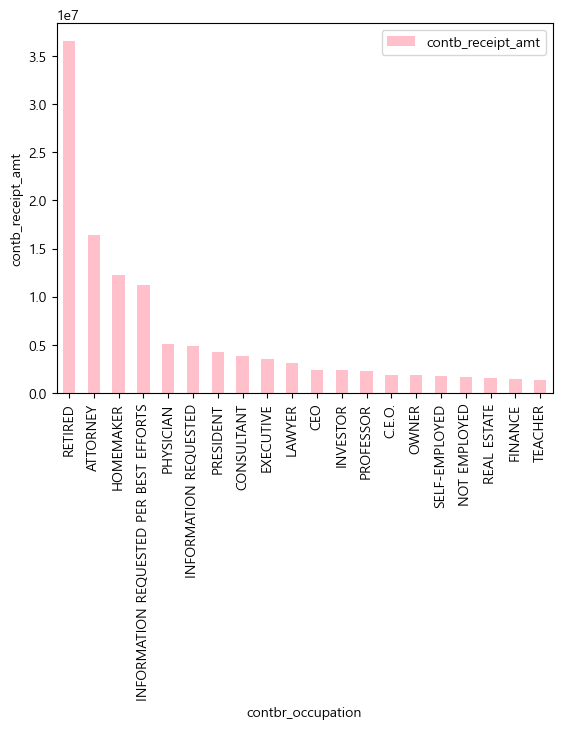

In [81]:
bye.plot(kind='bar' , color="pink")
plt.xlabel('contbr_occupation')
plt.ylabel('contb_receipt_amt') 
plt.show()

In [89]:
obama = fec[fec["cand_nm"]=="Obama, Barack"]
obamaList =obama.groupby(["contbr_occupation","contb_receipt_amt"])["contb_receipt_amt"].sum()  
obama_data = obamaList.groupby("contbr_occupation").sum()
hionama = pd.DataFrame(obama_data , columns = ['contb_receipt_amt'])
hionama = hionama.sort_values(by="contb_receipt_amt", ascending=False )
oh = hionama.head(20)
# oh


romney = fec[fec["cand_nm"]=="Romney, Mitt"]
romneyList =romney.groupby(["contbr_occupation","contb_receipt_amt"])["contb_receipt_amt"].sum()  
romney_data = romneyList.groupby("contbr_occupation").sum()
hiromney = pd.DataFrame(romney_data , columns = ['contb_receipt_amt'])
hiromney = hiromney.sort_values(by="contb_receipt_amt", ascending=False )
ro = hiromney.head(20)
ro

,contb_receipt_amt
contbr_occupation,
RETIRED,11266949.23
INFORMATION REQUESTED PER BEST EFFORTS,11173374.84
HOMEMAKER,8037250.86
ATTORNEY,5302578.82
PRESIDENT,2403439.77
EXECUTIVE,2230653.79
C.E.O.,1893931.11
INVESTOR,1494725.12
CONSULTANT,1404576.94


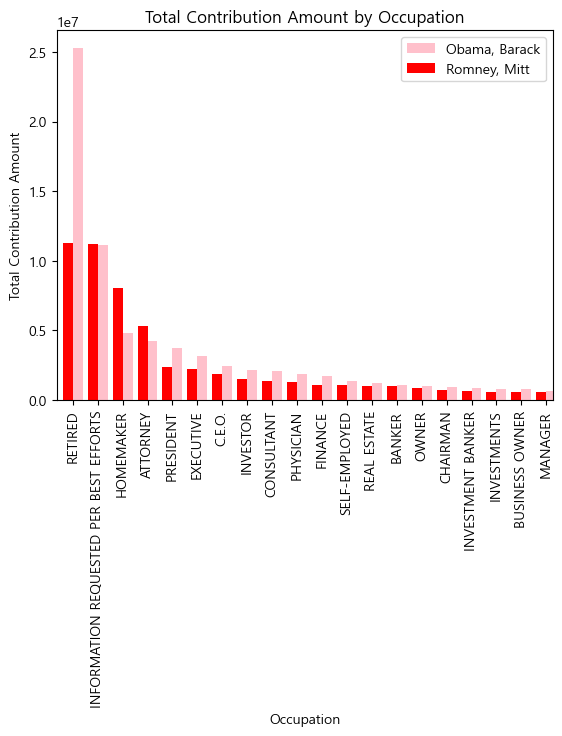

In [94]:
fig, ax = plt.subplots()

oh.plot(kind='bar', color="pink", ax=ax, position=0, width=0.4)
ro.plot(kind='bar', color="red", ax=ax, position=1, width=0.4)

plt.legend(["Obama, Barack", "Romney, Mitt"])
plt.xlabel("Occupation")
plt.ylabel("Total Contribution Amount")
plt.title("Total Contribution Amount by Occupation")

plt.show()

In [98]:
#교수님이 한방법. 
RvsO=fec[(fec["cand_nm"]=="Obama, Barack") | (fec["cand_nm"]=="Romney, Mitt")]
RvsO

,cmte_id,cand_id,cand_nm,contbr_nm,contbr_city,contbr_st,contbr_zip,contbr_employer,contbr_occupation,contb_receipt_amt,contb_receipt_dt,receipt_desc,memo_cd,memo_text,form_tp,file_num
411,C00431171,P80003353,"Romney, Mitt","ELDERBAUM, WILLIAM",DPO,AA,340230183.0,US GOVERNMENT,FOREIGN SERVICE OFFICER,25.0,01-FEB-12,NaN,NaN,NaN,SA17A,780124
412,C00431171,P80003353,"Romney, Mitt","ELDERBAUM, WILLIAM",DPO,AA,340230183.0,US GOVERNMENT,FOREIGN SERVICE OFFICER,110.0,01-FEB-12,NaN,NaN,NaN,SA17A,780124
413,C00431171,P80003353,"Romney, Mitt","CARLSEN, RICHARD",APO,AE,91280020.0,DEFENSE INTELLIGENCE AGENCY,INTELLIGENCE ANALYST,250.0,13-APR-12,NaN,NaN,NaN,SA17A,785689
414,C00431171,P80003353,"Romney, Mitt","DELUCA, PIERRE",APO,AE,91280005.0,CISCO,ENGINEER,30.0,21-AUG-11,NaN,NaN,NaN,SA17A,760261
415,C00431171,P80003353,"Romney, Mitt","SARGENT, MICHAEL",APO,AE,90120092.0,RAYTHEON TECHNICAL SERVICES CORP,COMPUTER SYSTEMS ENGINEER,100.0,07-MAR-12,NaN,NaN,NaN,SA17A,780128
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
701381,C00431445,P80003338,"Obama, Barack","MOUNTS, ROBERT",APO,ZZ,962043077,HQ USFK (FKDC-SA),GS-15 INTERNATIONAL RELATIONS OFFICER,25.0,26-FEB-12,NaN,NaN,NaN,SA17A,787803
701382,C00431445,P80003338,"Obama, Barack","TAITANO, TYRONE",HAGATNA,ZZ,969323373,NOT EMPLOYED,RETIRED,250.0,20-JAN-12,NaN,NaN,NaN,SA17A,775668
701383,C00431445,P80003338,"Obama, Barack","TUCKER, PAMELA",APO,ZZ,963190030,DODEA,EDUCATOR,3.0,20-JAN-12,NaN,NaN,NaN,SA17A,775668
701384,C00431445,P80003338,"Obama, Barack","MOUNTS, ROBERT",APO,ZZ,962043077,HQ USFK (FKDC-SA),GS-15 INTERNATIONAL RELATIONS OFFICER,25.0,26-APR-12,NaN,NaN,NaN,SA17A,785239


In [102]:
by_occu = RvsO.pivot_table("contb_receipt_amt", index= "contbr_occupation", columns="cand_nm", aggfunc="sum")
by_occu

cand_nm,"Obama, Barack","Romney, Mitt"
contbr_occupation,,
MIXED-MEDIA ARTIST / STORYTELLER,100.0,NaN
AREA VICE PRESIDENT,250.0,NaN
RESEARCH ASSOCIATE,100.0,NaN
TEACHER,500.0,NaN
THERAPIST,3900.0,NaN
...,...,...
ZEPPOS AND ASSOCIATES,1000.0,NaN
ZONE MANAGER,135.0,NaN
ZOOKEEPER,35.0,NaN


<Axes: ylabel='contbr_occupation'>

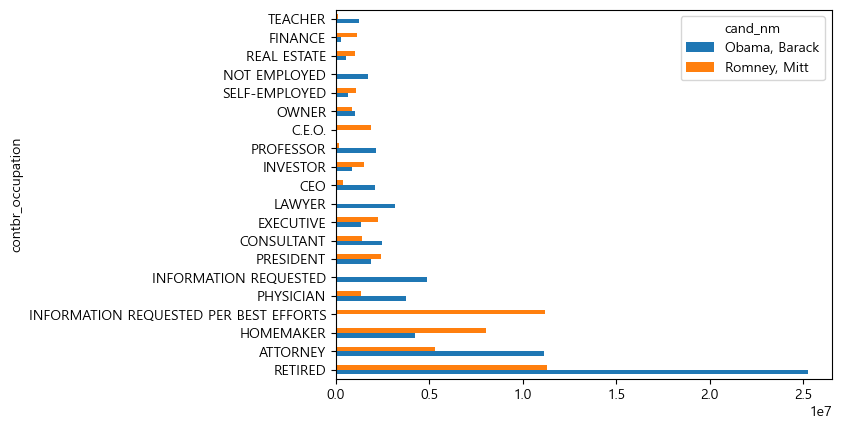

In [120]:
#상위 금액 20위 
# by_occu.sum(axis=1).sort_values() # - 는 돈환급 받은것. 


# top20 = by_occu.sum(axis=1).sort_values(ascending= False).head(20).index  

top20 = by_occu.sum(axis=1).sort_values(ascending= False)[:20].index
# top20

by_occu.loc[top20].plot(kind="barh") #bar == 세로 barh == 가로

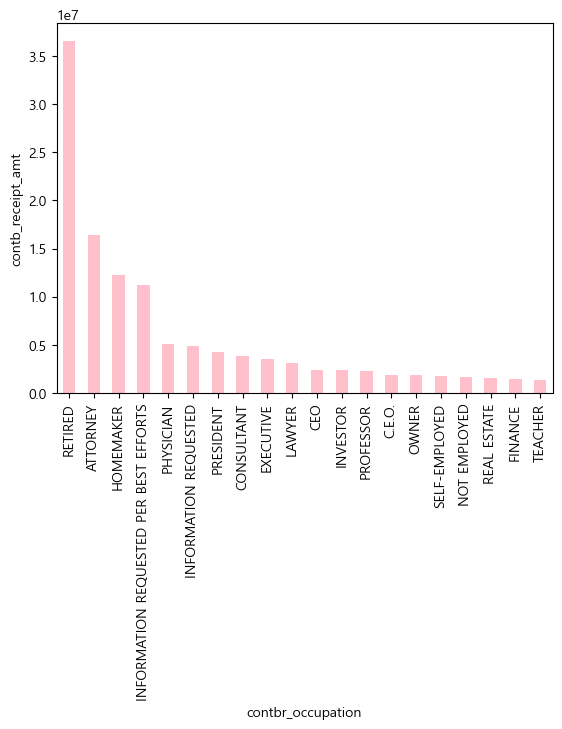